In [ ]:
# importing necessary libraries
import torch
import torch.nn as nn
from tqdm.auto import tqdm
import os
import cv2
import math
import matplotlib.pyplot as plt
import glob
import numpy as np
import random
from PIL import Image


In [ ]:
# adding paths
train_img_dir = 'hit-uav/images/train'
train_label_dir = 'hit-uav/labels/train'
val_img_dir = 'hit-uav/images/val'
val_label_dir = 'hit-uav/labels/val'
test_img_dir = 'hit-uav/images/test'
test_label_dir = 'hit-uav/labels/test'

In [ ]:
# creating a list of classes and colors for visualization
np.random.seed(44)
classes = ['Person', 'Car', 'Bicycle', 'OtherVechicle', 'DontCare']
colors = np.random.uniform(0, 255, size=(len(classes), 3))

In [4]:
# Function to convert YOLO format bounding boxes to xmin, ymin, xmax, ymax format

def yolo2bbox(bboxes):
    """This function takes a bounding box in the format [x_center, y_center, width, height]
    and converts it to the format [xmin, ymin, xmax, ymax].
    The conversion is done by calculating the top-left corner (xmin, ymin) and the bottom-right corner (xmax, ymax)
    based on the center coordinates and dimensions of the bounding box."""
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
# Function to plot bounding boxes on an image
def plot_box(image, bboxes, labels, classes=classes, colors=colors, pos='above'):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    height, width, _ = image.shape
    lw = max(round(sum(image.shape) / 2 * 0.003), 2)  # Line width.
    tf = max(lw - 1, 1) # Font thickness.
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*width)
        ymin = int(y1*height)
        xmax = int(x2*width)
        ymax = int(y2*height)

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        
        class_name = classes[int(labels[box_num])]

        color=colors[classes.index(class_name)]
        
        cv2.rectangle(
            image, 
            p1, p2,
            color=color, 
            thickness=lw,
            lineType=cv2.LINE_AA
        ) 

        # For filled rectangle.
        w, h = cv2.getTextSize(
            class_name, 
            0, 
            fontScale=lw / 3, 
            thickness=tf
        )[0]

        outside = p1[1] - h >= 3
        
        if pos == 'above':
            p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
            cv2.rectangle(
                image, 
                p1, p2, 
                color=color, 
                thickness=-1, 
                lineType=cv2.LINE_AA
            )  
            cv2.putText(
                image, 
                class_name, 
                (p1[0], p1[1] - 5 if outside else p1[1] + h + 2),
                cv2.FONT_HERSHEY_SIMPLEX, 
                fontScale=lw/3.5, 
                color=(255, 255, 255), 
                thickness=tf, 
                lineType=cv2.LINE_AA
            )
        else:
            new_p2 = p1[0] + w, p2[1] + h + 3 if outside else p2[1] - h - 3
            cv2.rectangle(
                image, 
                (p1[0], p2[1]), new_p2, 
                color=color, 
                thickness=-1, 
                lineType=cv2.LINE_AA
            )  
            cv2.putText(
                image, 
                class_name, 
                (p1[0], p2[1] + h + 2 if outside else p2[1]),
                cv2.FONT_HERSHEY_SIMPLEX, 
                fontScale=lw/3, 
                color=(255, 255, 255), 
                thickness=tf, 
                lineType=cv2.LINE_AA
            )
    return image

In [ ]:
# Function to plot images with bounding boxes
def plot(image_path, label_path, num_samples, classes=classes, colors=colors, pos='above'):
    all_training_images = glob.glob(image_path+'/*')
    all_training_labels = glob.glob(label_path+'/*')
    all_training_images.sort()
    all_training_labels.sort()
    
    temp = list(zip(all_training_images, all_training_labels))
    random.shuffle(temp)
    all_training_images, all_training_labels = zip(*temp)
    all_training_images, all_training_labels = list(all_training_images), list(all_training_labels)
    
    num_images = len(all_training_images)
    
    if num_samples == -1:
        num_samples = num_images
    
    num_cols = 2
    num_rows = int(math.ceil(num_samples / num_cols))
        
    plt.figure(figsize=(10 * num_cols, 6 * num_rows))
    for i in range(num_samples):
        image_name = all_training_images[i].split(os.path.sep)[-1]
        image = cv2.imread(all_training_images[i])
        with open(all_training_labels[i], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label, x_c, y_c, w, h = label_line.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        plot_box(image, bboxes, labels, classes, colors, pos)
        plt.subplot(num_rows, num_cols, i+1) # Visualize 2x2 grid of images.
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

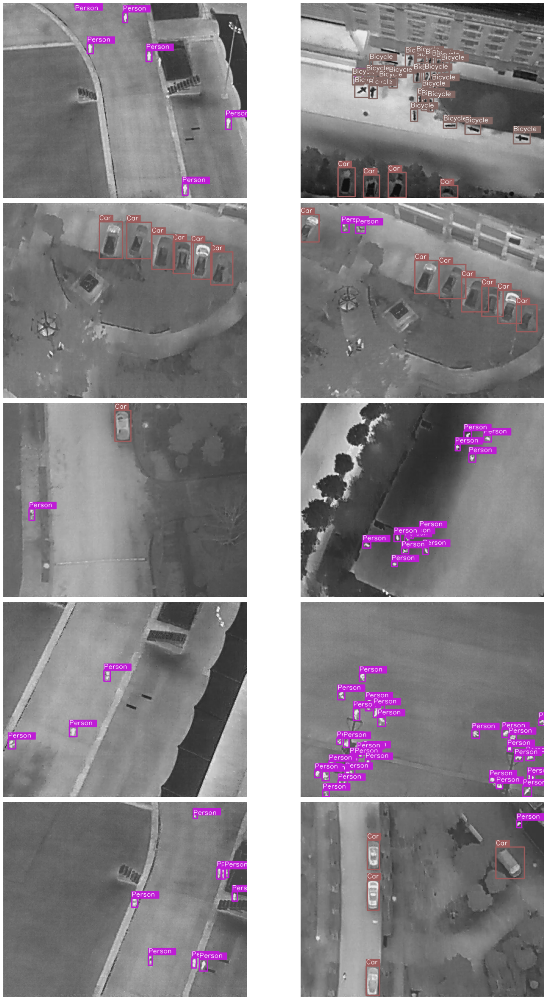

In [ ]:
# Plotting a few training images with bounding boxes
plot(
    image_path = train_img_dir, 
    label_path = train_label_dir,
    num_samples=10
)

In [ ]:
# Writing the dataset configuration file for YOLO
%%writefile dataset.yaml

path: C:\ml_algorithms\PyTorch\Computer_Vision_001\hit-uav
train: images/train
val: images/val
test: images/test
names:
  0: Person
  1: Car
  2: Bicycle
  3: OtherVehicle
  4: DontCare
nc: 5

In [9]:
import os
os.environ['WANDB_DISABLED'] = 'true'

In [ ]:
# importing the YOLO model from ultralytics
from ultralytics import YOLO
model = YOLO("yolov8m.pt")

In [ ]:
# Training the YOLO model on the dataset
# Note: Make sure to have the dataset.yaml file in the current directory
results = model.train(
   data='dataset.yaml',
   imgsz=512,
   epochs=50,
   batch=16,
   name='yolov8m_v8_50e'
)


In [12]:
import os
print(os.listdir("runs\detect\yolov8m_v8_50e"))


['args.yaml', 'weights']


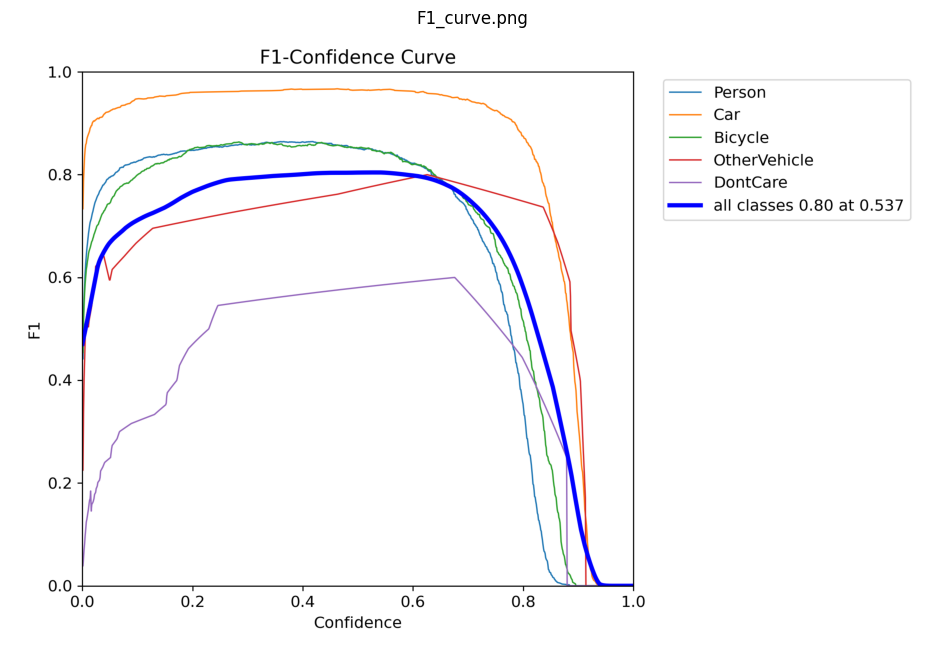

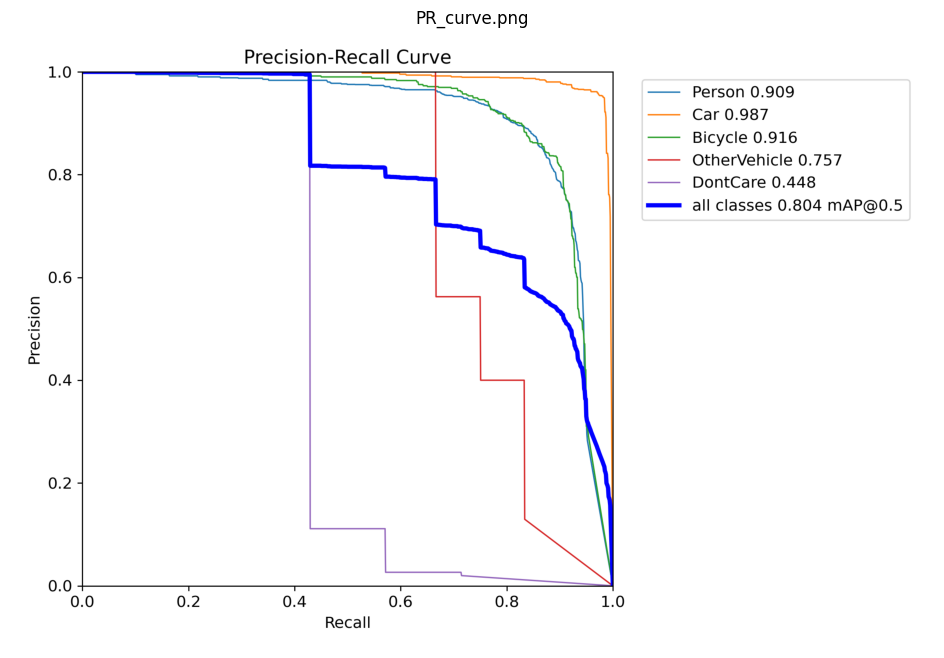

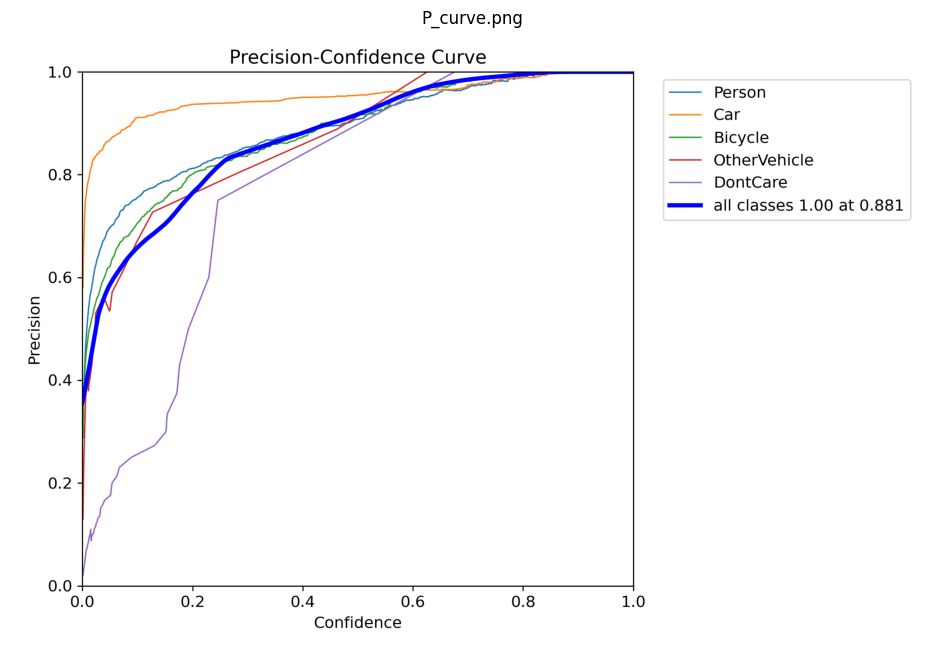

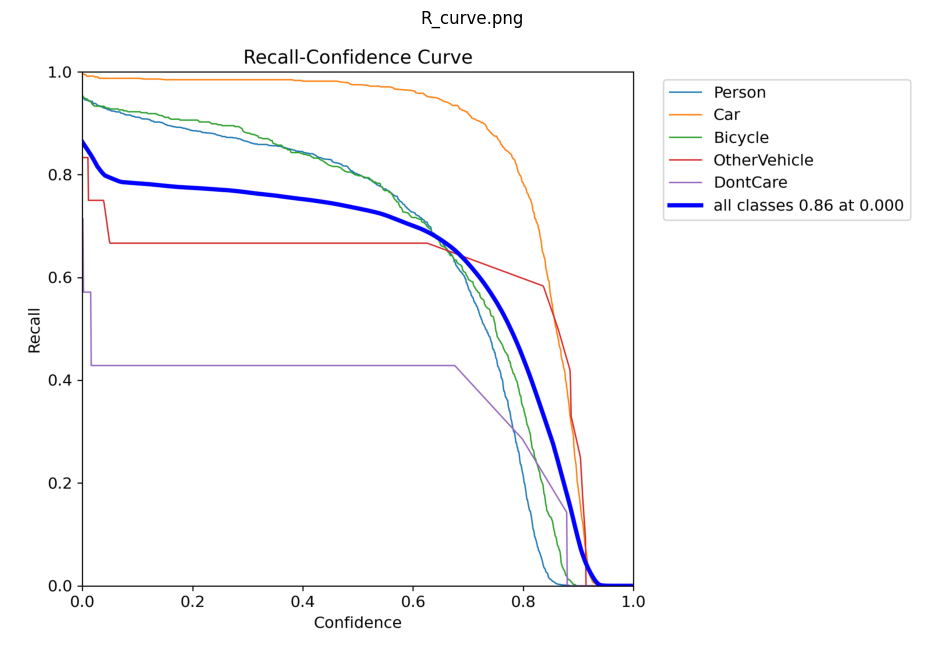

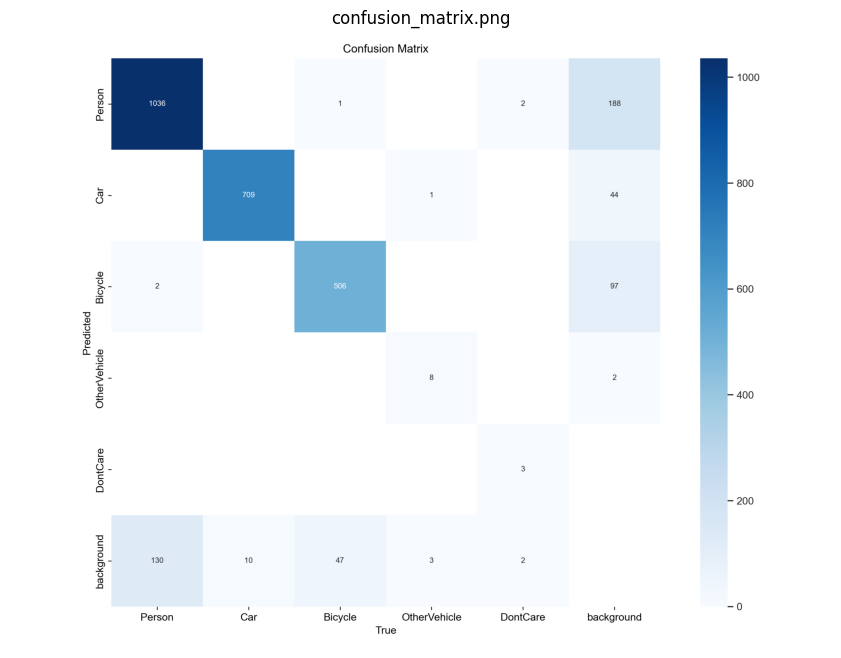

...

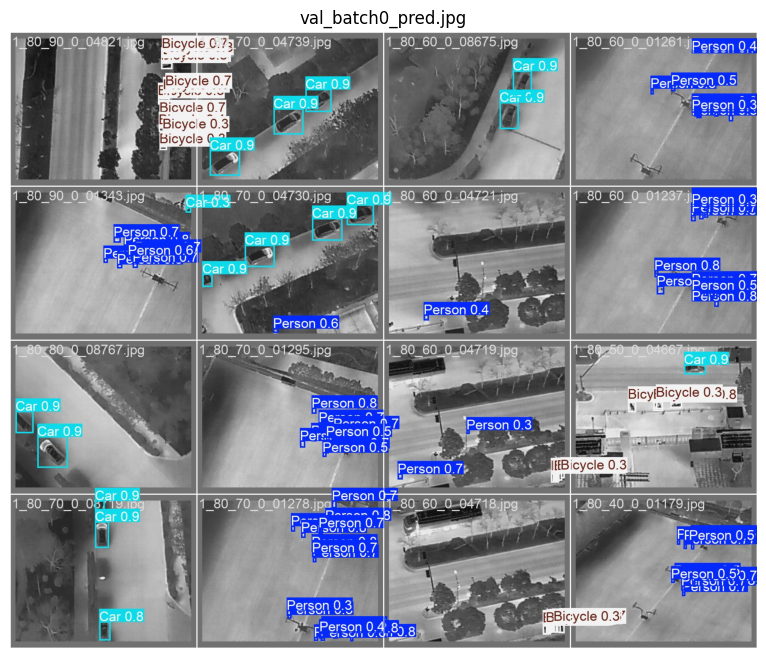

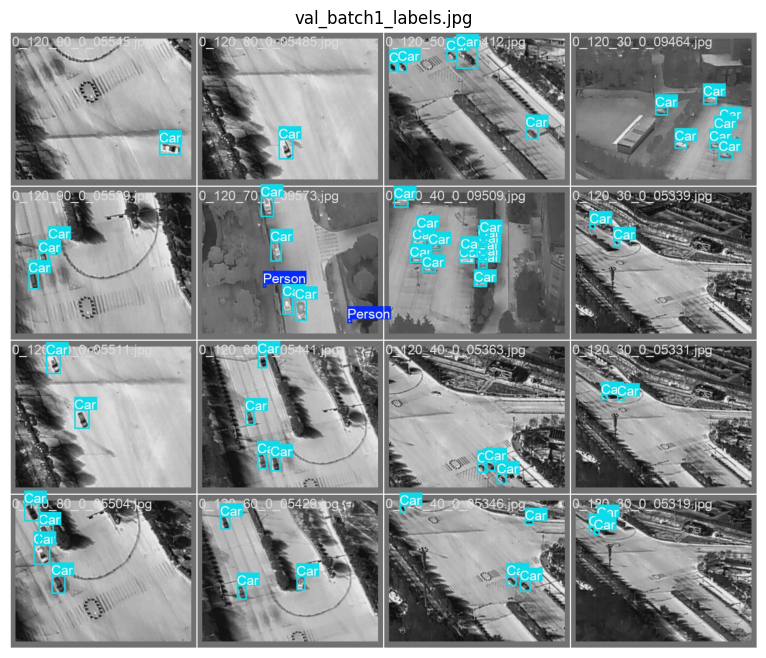

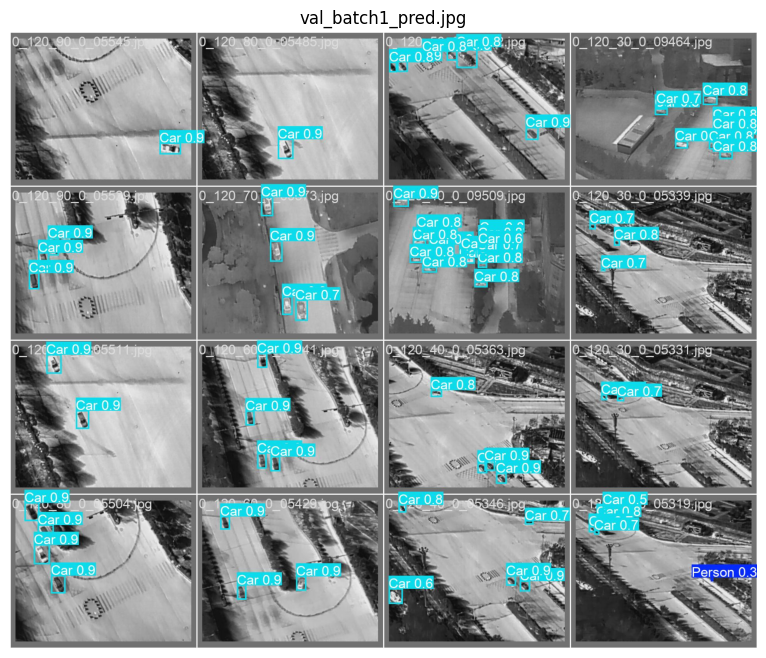

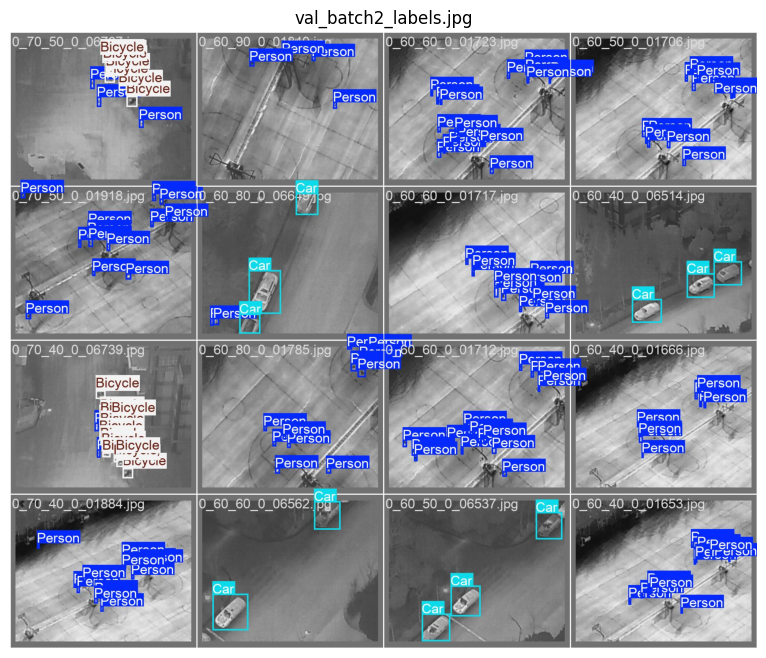

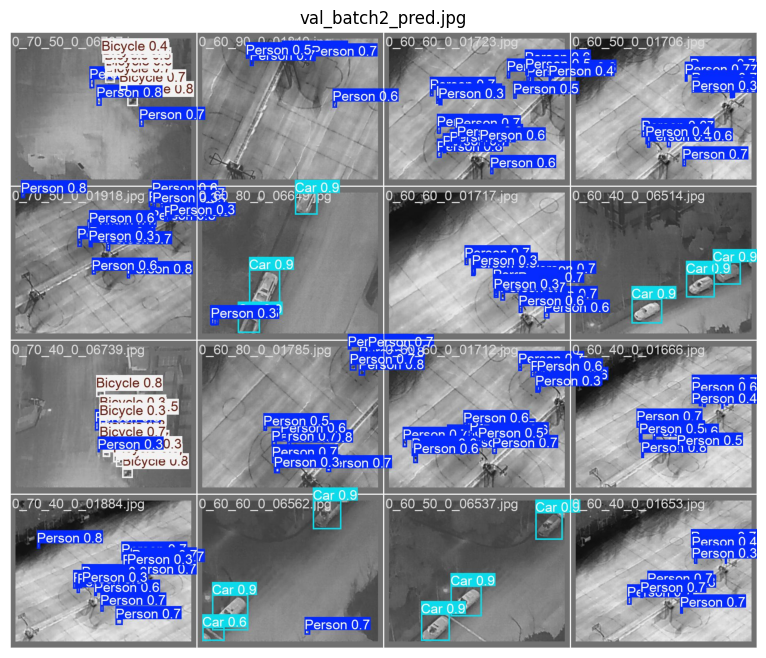

In [ ]:
# Visualizing the training results
from imutils import paths

log_dir = "runs\detect\yolov8m_v8_50e4"
for image_path in sorted(paths.list_images(log_dir)):
    image = Image.open(image_path)
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.title(os.path.basename(image_path))
    plt.axis('off')
    plt.show()

In [ ]:
# loading the best model weights
model = YOLO("runs/detect/yolov8m_v8_50e4/weights/best.pt")
results = model(r'C:\ml_algorithms\PyTorch\Computer_Vision_001\hit-uav\images\test', 
                conf=0.5, agnostic_nms=True, iou=0.5, save=True)

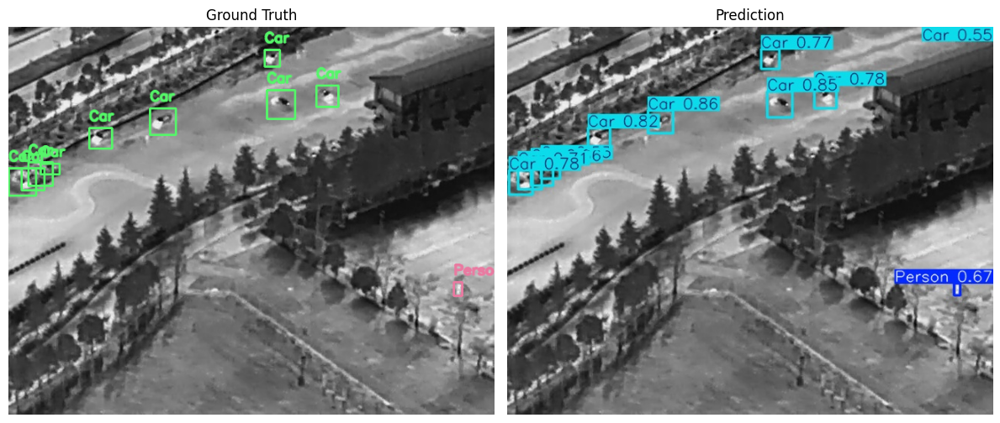

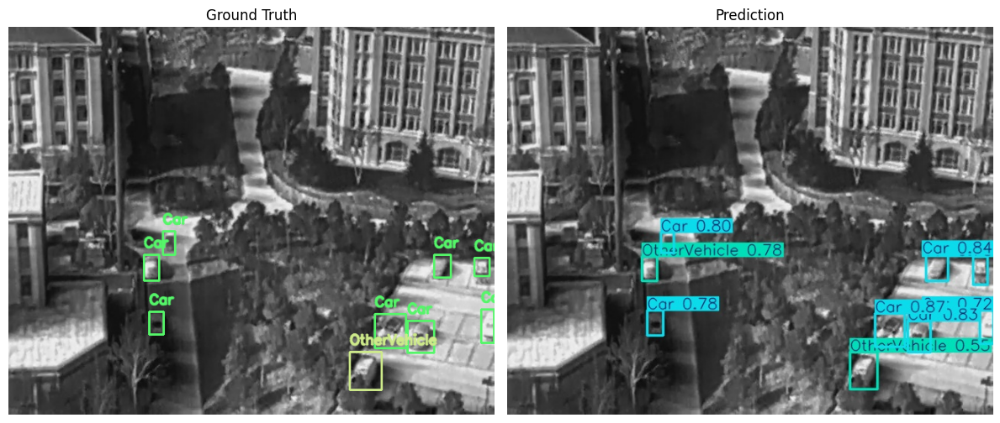

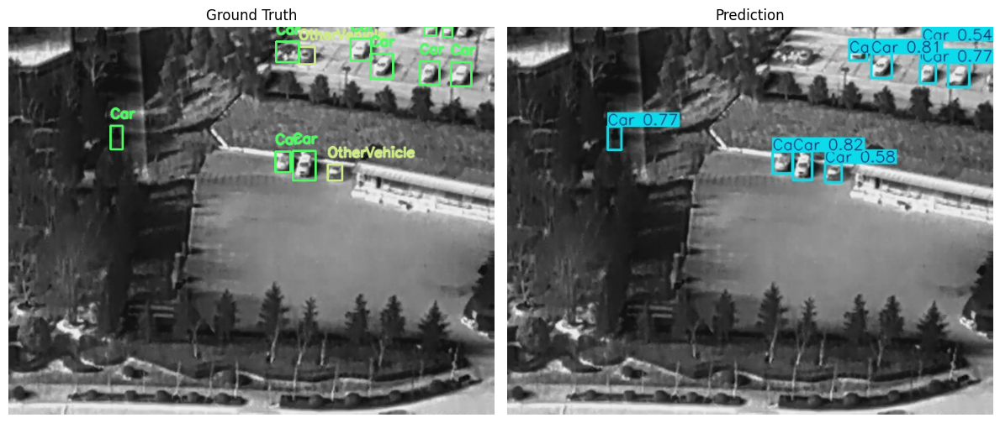

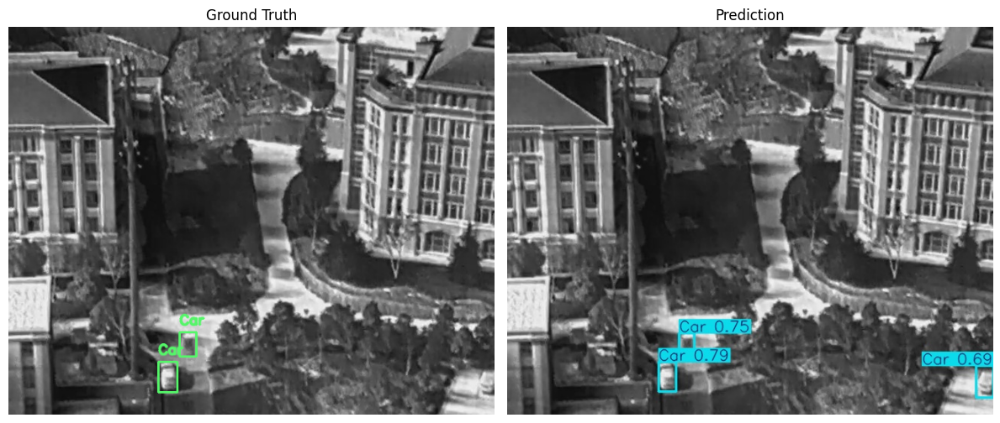

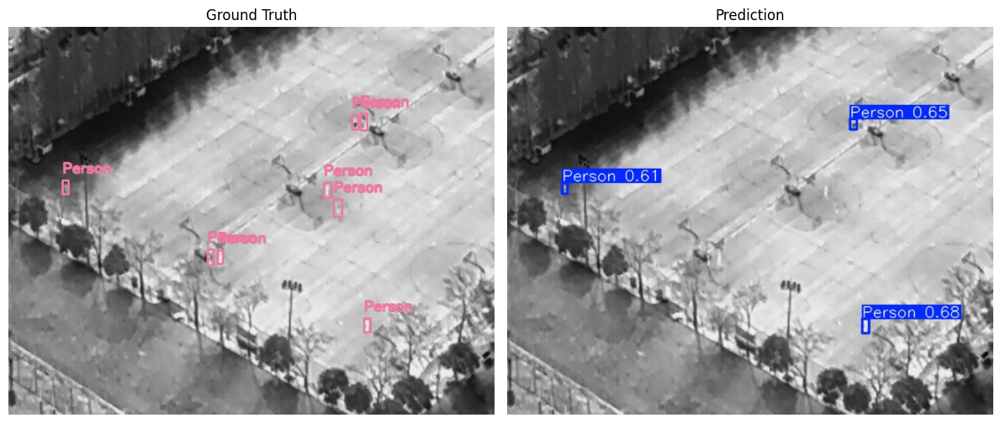

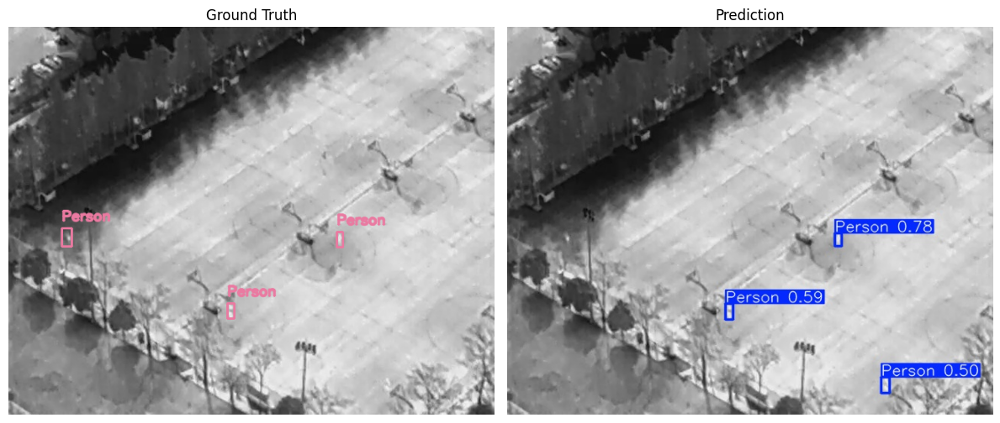

In [ ]:
# comparing ground truth and predicted images

# ==== CONFIG ====
n = 6  # Number of images to show
img_dir = r'C:\ml_algorithms\PyTorch\Computer_Vision_001\hit-uav\images\test'
label_dir = r'C:\ml_algorithms\PyTorch\Computer_Vision_001\hit-uav\labels\test'
predict_dir = r'C:\ml_algorithms\PyTorch\Computer_Vision_001\runs\detect\predict'
class_names = ['Person', 'Car', 'Bicycle', 'OtherVehicle', 'DontCare']
np.random.seed(34)
colors = np.random.randint(0, 255, size=(len(class_names), 3))

# ==== UTILITY TO DRAW GROUND TRUTH BOXES ====
def draw_yolo_labels(image_path, label_path):
    img = cv2.imread(image_path)
    h, w, _ = img.shape
    if not os.path.exists(label_path):
        return img

    with open(label_path, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()
            cls_id, x_center, y_center, box_w, box_h = map(float, parts)
            x1 = int((x_center - box_w / 2) * w)
            y1 = int((y_center - box_h / 2) * h)
            x2 = int((x_center + box_w / 2) * w)
            y2 = int((y_center + box_h / 2) * h)
            color = [int(c) for c in colors[int(cls_id)]]
            cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness = 2)
            # Label text
            font_size = 0.6      # <-- Scale of font
            font_thickness = 2   # <-- Thickness of the font

            cv2.putText(
                img,
                class_names[int(cls_id)],       # Label text
                (x1, y1 - 10),                   # Position (above box)
                cv2.FONT_HERSHEY_SIMPLEX,       # Font style
                font_size,                      # Font scale (size)
                color,                          # Font color
                font_thickness,                 # Thickness
                lineType=cv2.LINE_AA            # Anti-aliased line
            )
    return img

# ==== MAIN LOOP ====
img_files = sorted(glob(os.path.join(img_dir, '*.jpg')))
for i in range(min(n, len(img_files))):
    img_path = img_files[i]
    img_name = os.path.basename(img_path)
    label_path = os.path.join(label_dir, img_name.replace('.jpg', '.txt'))
    pred_path = os.path.join(predict_dir, img_name)

    # Ground truth image
    gt_img = draw_yolo_labels(img_path, label_path)
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)

    # Predicted image
    pred_img = Image.open(pred_path)
    pred_img = pred_img.convert('RGB')
    pred_img = np.array(pred_img)

    # Plot side-by-side
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(gt_img)
    plt.title('Ground Truth')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(pred_img)
    plt.title('Prediction')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


Found 2 images

0: 288x512 13 Cars, 1 Bicycle, 133.6ms
Speed: 3.8ms preprocess, 133.6ms inference, 8.7ms postprocess per image at shape (1, 3, 288, 512)


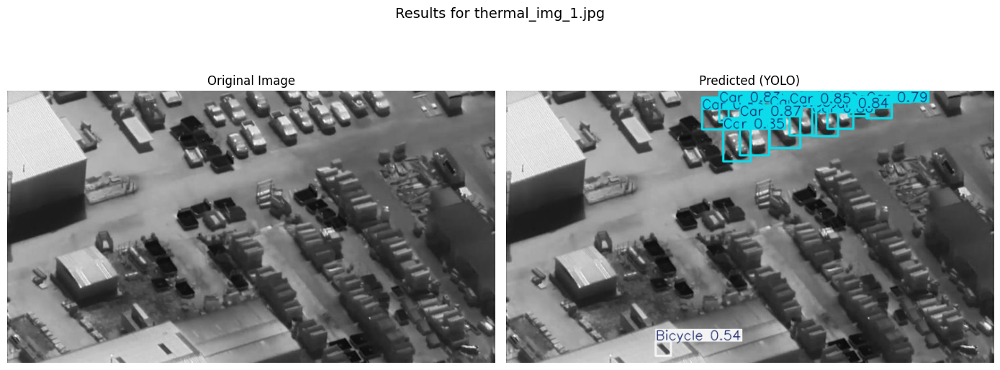


0: 384x512 4 Persons, 3 Cars, 175.1ms
Speed: 8.0ms preprocess, 175.1ms inference, 4.6ms postprocess per image at shape (1, 3, 384, 512)


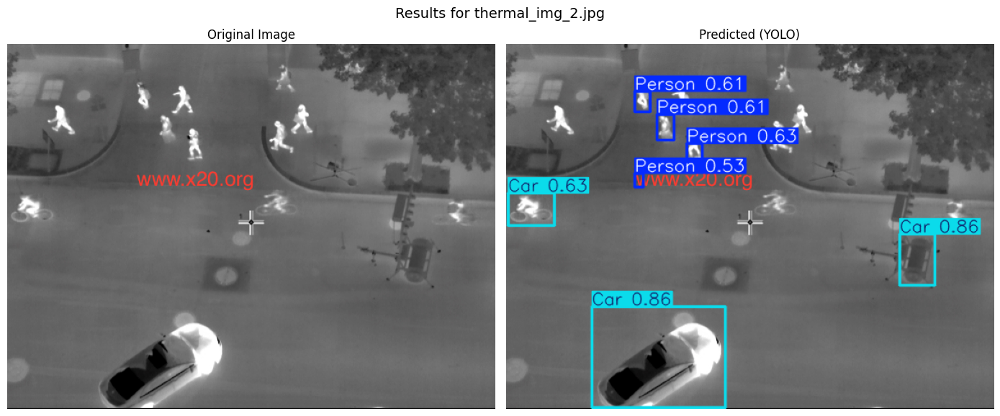

In [ ]:
# using custom images to see the results
custom_images_dir = r'hit-uav\custom_images'  # or 'hit-uav/custom_images'
custom_images = glob.glob(os.path.join(custom_images_dir, '*.jpg'))

print(f"Found {len(custom_images)} images")

for custom_image in custom_images:
    image = cv2.imread(custom_image)
    results = model(image, conf=0.5, agnostic_nms=True, iou=0.5)
    annotated_image = results[0].plot()  # Image with boxes

    # Convert BGR to RGB for display
    original_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    predicted_rgb = annotated_image[:, :, ::-1]

    # Plot original vs predicted
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(original_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(predicted_rgb)
    plt.title('Predicted (YOLO)')
    plt.axis('off')

    plt.suptitle(f"Results for {os.path.basename(custom_image)}", fontsize=14)
    plt.tight_layout()
    plt.show()